### Notebook for the clustering and annotation of MultiC cells 

- **Developed by:** Carlos Talavera-López Ph.D
- **Institute of Systems Immunology (WüSI) - JMU-Würzburg**
- v230612

### Import required modules

In [1]:
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from SCCAF import SCCAF_assessment, plot_roc

### Set up working environment

In [22]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.2
-----
PIL                 9.4.0
SCCAF               NA
appnope             0.1.3
asttokens           NA
backcall            0.2.0
cffi                1.15.1
colorama            0.4.6
comm                0.1.2
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
executing           1.2.0
h5py                3.8.0
igraph              0.10.4
importlib_resources NA
ipykernel           6.21.2
jedi                0.18.2
joblib              1.2.0
kiwisolver          1.4.4
leidenalg           0.9.1
llvmlite            0.39.1
louvain             0.8.0
matplotlib          3.7.0
matplotlib_inline   0.1.6
mpl_toolkits        NA
natsort             8.2.0
numba               0.56.4
numexpr             2.8.4
numpy               1.23.5
packaging           23.0
pandas              1.5.3
parso               0.8.3
patsy               0.5.3
pexpect             4.8.0
pickleshare         0.7.

### Read in Healthy data

In [3]:
epith_multiC = sc.read_h5ad('../../../data/Epithelial_MultiC_ctl230609_scANVI_annotated.raw.h5ad')
epith_multiC

AnnData object with n_obs × n_vars = 4645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts

In [4]:
epith_multiC.obs['C_scANVI_v2'].cat.categories

Index(['Goblet', 'Multiciliated', 'Suprabasal'], dtype='object')

In [5]:
epith_multiC.obs['donor'].cat.categories

Index(['CHE-01', 'CHE-02', 'CHE-03', 'CSE-03', 'CSE-06', 'CSE-07', 'GER-02',
       'GER-12', 'GER-14', 'GNR-06', 'GNR-07', 'GNR-08'],
      dtype='object')

- Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No d

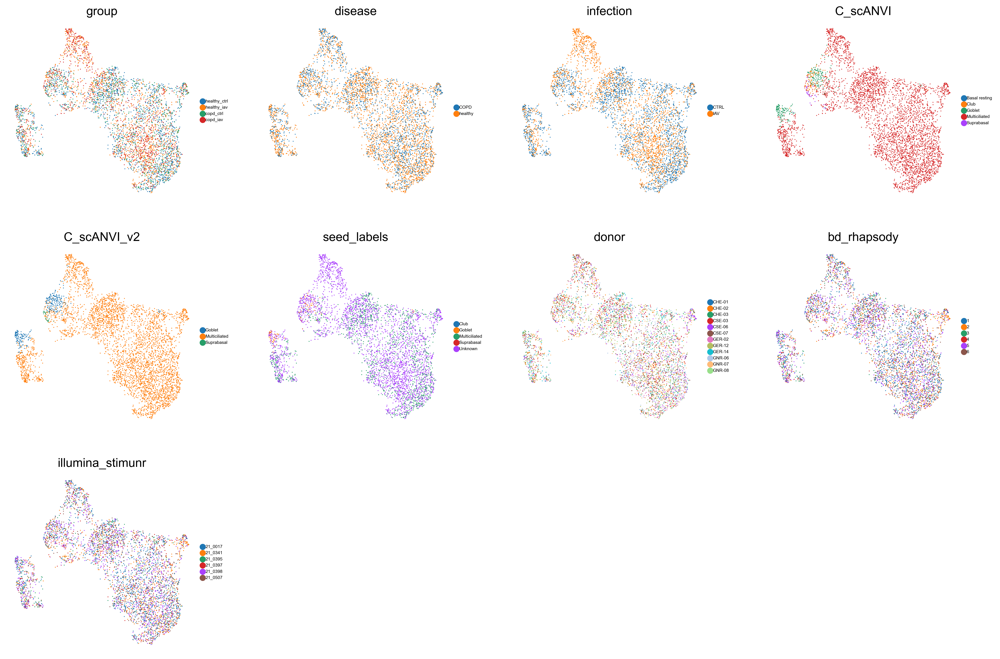

In [8]:
sc.pp.neighbors(epith_multiC, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(epith_multiC, min_dist = 0.3, spread = 3, random_state = 1712)
sc.pl.umap(epith_multiC, frameon = False, color = ['group', 'disease', 'infection', 'C_scANVI', 'C_scANVI_v2', 'seed_labels', 'donor', 'bd_rhapsody', 'illumina_stimunr'], size = 4, legend_fontsize = 5, ncols = 4)

/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


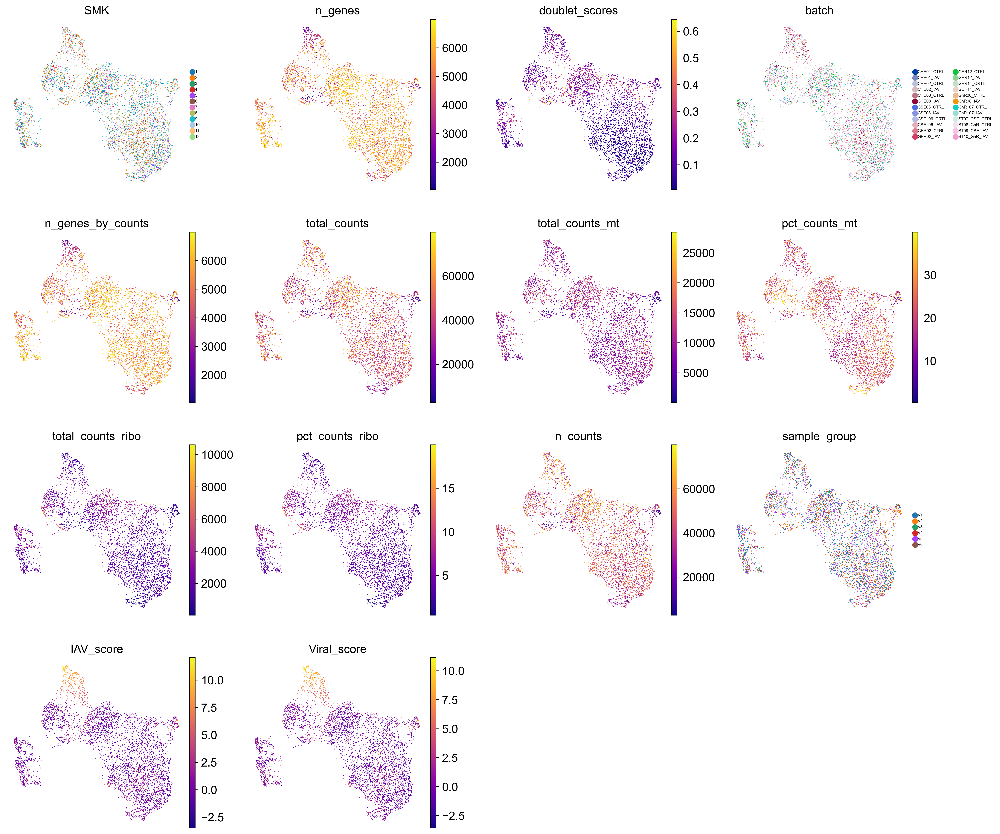

In [9]:
sc.pl.umap(epith_multiC, frameon = False, color = ['SMK', 'n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts', 'sample_group', 'IAV_score', 'Viral_score'], size = 4, legend_fontsize = 5, ncols = 4, cmap = 'plasma')

### Clustering manifold for Mixed cell states identification

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


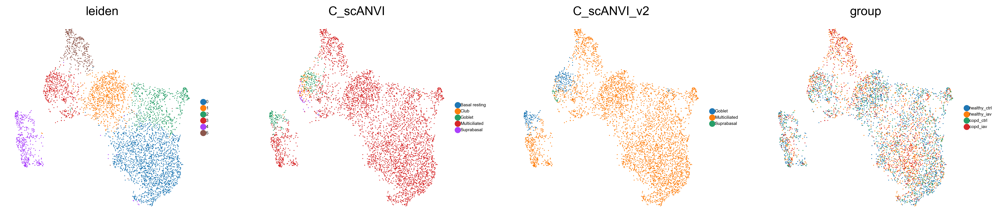

In [19]:
sc.tl.leiden(epith_multiC, resolution = 0.5, random_state = 1712)
sc.pl.umap(epith_multiC, frameon = False, color = ['leiden', 'C_scANVI', 'C_scANVI_v2', 'group'], size = 4, legend_fontsize = 5, ncols = 4)

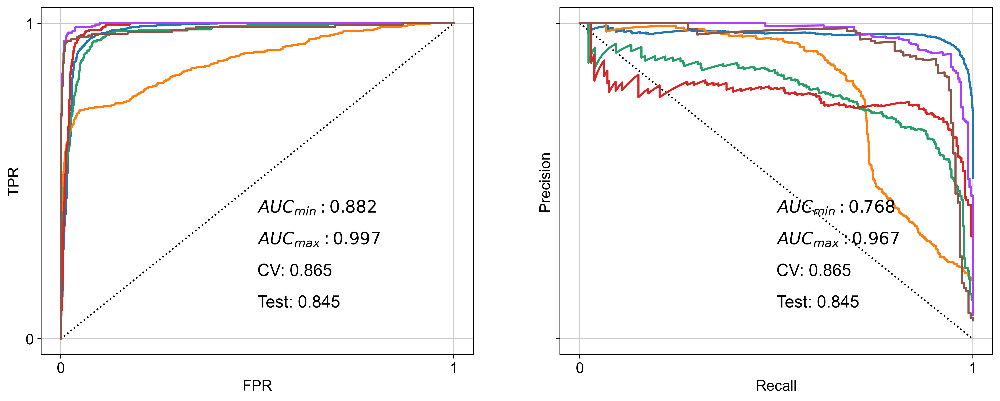

In [21]:
y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(epith_multiC.X, epith_multiC.obs['leiden'], n = 300)
plot_roc(y_prob, y_test, clf, cvsm = cvsm, acc = acc)
plt.rcParams["figure.figsize"] = (16,6)
plt.show()

### Annotate clusters based on marker genes WRST

In [23]:
epith_multiC_log = epith_multiC.copy()
epith_multiC_log

AnnData object with n_obs × n_vars = 4645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts

In [24]:
sc.pp.normalize_total(epith_multiC_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(epith_multiC_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['BPIFA1', 'MALAT1', 'MT-ATP6', 'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MTRNR2L12', 'MTRNR2L8', 'NC_026431.1', 'NC_026432.1', 'NC_026433.1', 'NC_026434.1', 'NC_026435.1', 'NC_026436.1', 'NC_026437.1', 'NC_026438.1', 'SAA1', 'SCGB1A1', 'SLPI']
    finished (0:00:00)


In [25]:
sc.tl.rank_genes_groups(epith_multiC_log, 'leiden', method = 'wilcoxon', n_genes = 100, use_raw = False)
result = epith_multiC_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:14)


,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,3_l,3_p,4_n,4_l,4_p,5_n,5_l,5_p
0,ALDH3B1,3.160033,0.0,SERPINB3,4.093901,4.615563e-171,CDKN1A,1.000647,4.194453e-118,CRABP2,4.931115,4.994460e-170,CDC20B,10.895709,1.250306e-257,NC_026436.1,9.600366,2.860147e-211
1,LDLRAD1,3.010362,0.0,WFDC2,1.596261,4.615563e-171,PLAU,4.435021,1.013238e-101,MT1X,3.271737,9.350569e-159,TUBA1B,2.958416,7.989591e-230,NC_026431.1,9.178522,2.860147e-211
2,TPPP3,2.217372,0.0,CXCL17,2.817996,1.800125e-160,GADD45A,2.392764,2.865409e-101,LDHA,2.914750,1.686439e-154,CDK1,7.454375,1.713331e-221,NC_026432.1,10.168210,2.244695e-210
3,FAM216B,3.325563,0.0,SLPI,1.596314,2.881865e-156,TNFRSF12A,3.246827,2.197080e-92,GRN,3.199596,2.627078e-145,BTG3,4.749447,6.555561e-204,NC_026434.1,10.102953,3.142742e-209
4,RSPH1,2.207991,0.0,BPIFB1,3.164303,6.218592e-148,EIF1,0.762863,7.532883e-91,CTSC,3.919050,9.792997e-145,CCNO,6.161895,1.539746e-198,NC_026433.1,9.412123,4.584332e-207
5,SNTN,2.812428,0.0,SCGB3A1,2.939314,2.577371e-147,SQSTM1,1.482664,2.767905e-90,SERPINB3,4.630020,1.627356e-142,ENO1,1.982111,1.905510e-198,NC_026435.1,9.734965,2.911617e-204
6,CAPS,1.999653,0.0,AGR2,2.023953,1.336331e-141,CDKN2B,3.447395,8.524832e-88,FAM83A,4.389714,1.346297e-138,CEP78,6.350083,7.555349e-190,NC_026438.1,9.864175,1.857764e-201
7,TSPAN1,1.217094,0.0,CTSC,3.282597,1.714801e-136,SFN,2.507762,3.633014e-85,CXCL17,2.956248,6.467400e-134,H2AFZ,2.222782,2.478890e-188,NC_026437.1,9.978683,3.471549e-201
8,RSPH4A,2.611639,0.0,CEACAM6,3.845211,8.254980e-131,IL32,3.960292,2.567159e-79,SPINT1,2.146930,1.682341e-133,KDELC2,7.601758,5.232233e-186,IFI6,2.831372,4.571991e-96
9,PIFO,1.845426,0.0,CP,3.134299,7.489708e-122,SLC3A2,2.758391,4.616631e-77,TPT1,1.019546,2.325879e-124,PLK4,8.926060,1.149514e-185,GPR158,8.063311,2.177279e-83


In [26]:
wilcox_markers.to_csv('Epithelial_MultiC_ctl230608_leiden_states_WilcoxRST_markers.csv', sep = ',', index = False)

/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


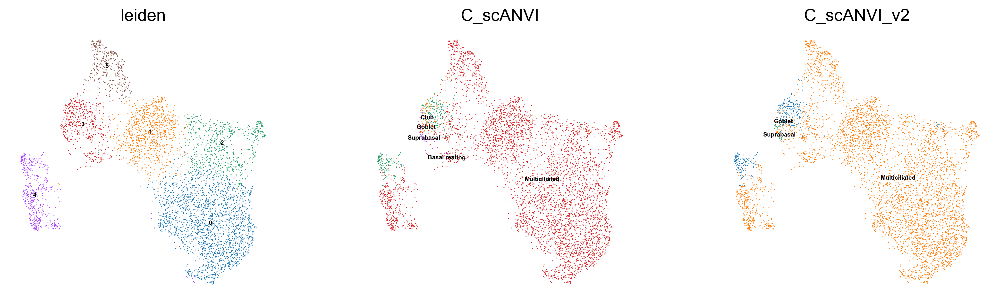

In [27]:
sc.pl.umap(epith_multiC, frameon = False, color = ['leiden', 'C_scANVI', 'C_scANVI_v2'], size = 2.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data')

In [28]:
epith_multiC.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5'], dtype='object')

/var/folders/rx/f17v355x1xqdpm4hlmym_zvw0000gn/T/ipykernel_4955/1667017290.py:2: FutureWarning: Setting categories in-place is deprecated and will raise in a future version. Use rename_categories instead.
  epith_multiC.obs['fine_states'].cat.categories = ['MultiC_OMG+', 'immuneBrush-Club', 'AT2_IL32+', 'Brush-Club_TCN1+', 'Ciliated_FOXN4+', 'iavEpi_OAS']
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


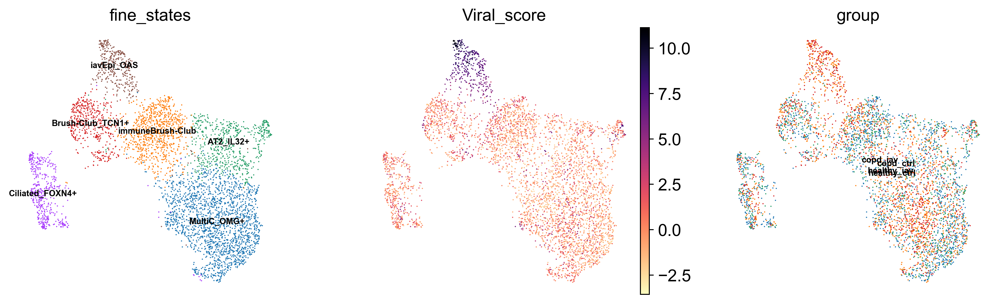

In [41]:
epith_multiC.obs['fine_states'] = epith_multiC.obs['leiden']
epith_multiC.obs['fine_states'].cat.categories = ['MultiC_OMG+', 'immuneBrush-Club', 'AT2_IL32+', 'Brush-Club_TCN1+', 'Ciliated_FOXN4+', 'iavEpi_OAS']
sc.pl.umap(epith_multiC, frameon = False, color = ['fine_states', 'Viral_score'], size = 4, legend_fontsize = 7, ncols = 4, legend_loc = 'on data')

In [34]:
epith_multiC_log.obs['fine_states'] = epith_multiC.obs['fine_states'].copy()
sc.tl.rank_genes_groups(epith_multiC_log, 'fine_states', method = 'wilcoxon', n_genes = 100, use_raw = False)
result = epith_multiC_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


,MultiC_OMG+_n,MultiC_OMG+_l,MultiC_OMG+_p,immuneBrush-Club_n,immuneBrush-Club_l,immuneBrush-Club_p,AT2_IL32+_n,AT2_IL32+_l,AT2_IL32+_p,Brush-Club_TCN1+_n,Brush-Club_TCN1+_l,Brush-Club_TCN1+_p,Ciliated_FOXN4+_n,Ciliated_FOXN4+_l,Ciliated_FOXN4+_p,iavEpi_OAS_n,iavEpi_OAS_l,iavEpi_OAS_p
0,ALDH3B1,3.160033,0.0,SERPINB3,4.093901,4.615563e-171,CDKN1A,1.000647,4.194453e-118,CRABP2,4.931115,4.994460e-170,CDC20B,10.895709,1.250306e-257,NC_026436.1,9.600366,2.860147e-211
1,LDLRAD1,3.010362,0.0,WFDC2,1.596261,4.615563e-171,PLAU,4.435021,1.013238e-101,MT1X,3.271737,9.350569e-159,TUBA1B,2.958416,7.989591e-230,NC_026431.1,9.178522,2.860147e-211
2,TPPP3,2.217372,0.0,CXCL17,2.817996,1.800125e-160,GADD45A,2.392764,2.865409e-101,LDHA,2.914750,1.686439e-154,CDK1,7.454375,1.713331e-221,NC_026432.1,10.168210,2.244695e-210
3,FAM216B,3.325563,0.0,SLPI,1.596314,2.881865e-156,TNFRSF12A,3.246827,2.197080e-92,GRN,3.199596,2.627078e-145,BTG3,4.749447,6.555561e-204,NC_026434.1,10.102953,3.142742e-209
4,RSPH1,2.207991,0.0,BPIFB1,3.164303,6.218592e-148,EIF1,0.762863,7.532883e-91,CTSC,3.919050,9.792997e-145,CCNO,6.161895,1.539746e-198,NC_026433.1,9.412123,4.584332e-207
5,SNTN,2.812428,0.0,SCGB3A1,2.939314,2.577371e-147,SQSTM1,1.482664,2.767905e-90,SERPINB3,4.630020,1.627356e-142,ENO1,1.982111,1.905510e-198,NC_026435.1,9.734965,2.911617e-204
6,CAPS,1.999653,0.0,AGR2,2.023953,1.336331e-141,CDKN2B,3.447395,8.524832e-88,FAM83A,4.389714,1.346297e-138,CEP78,6.350083,7.555349e-190,NC_026438.1,9.864175,1.857764e-201
7,TSPAN1,1.217094,0.0,CTSC,3.282597,1.714801e-136,SFN,2.507762,3.633014e-85,CXCL17,2.956248,6.467400e-134,H2AFZ,2.222782,2.478890e-188,NC_026437.1,9.978683,3.471549e-201
8,RSPH4A,2.611639,0.0,CEACAM6,3.845211,8.254980e-131,IL32,3.960292,2.567159e-79,SPINT1,2.146930,1.682341e-133,KDELC2,7.601758,5.232233e-186,IFI6,2.831372,4.571991e-96
9,PIFO,1.845426,0.0,CP,3.134299,7.489708e-122,SLC3A2,2.758391,4.616631e-77,TPT1,1.019546,2.325879e-124,PLK4,8.926060,1.149514e-185,GPR158,8.063311,2.177279e-83


In [35]:
wilcox_markers.to_csv('Epithelial_MultiC_ctl230612_fine_states_WilcoxRST_markers.csv', sep = ',', index = False)

/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


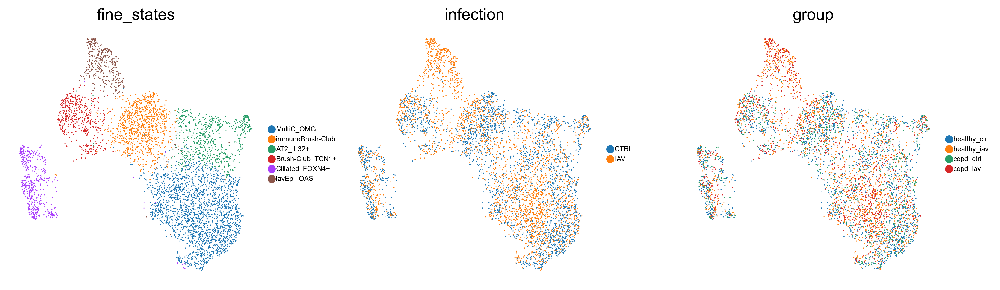

In [39]:
sc.pl.umap(epith_multiC, frameon = False, color = ['fine_states', 'infection', 'group'], size = 4, legend_fontsize = 6, ncols = 4)

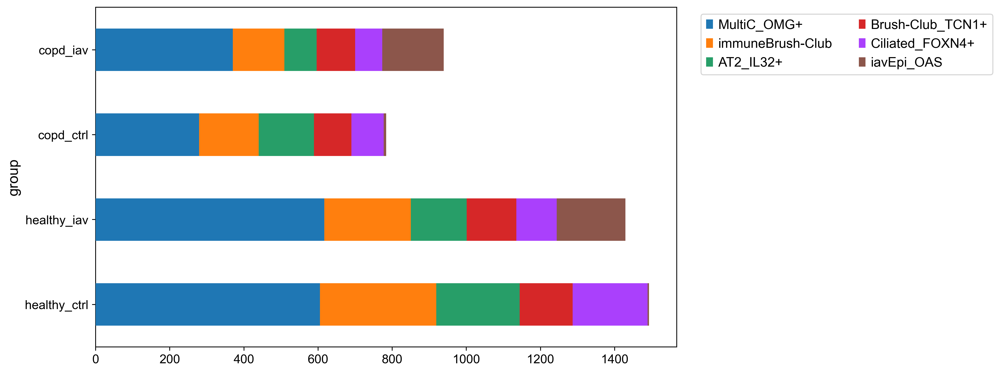

In [37]:
ax1 = pd.crosstab(epith_multiC.obs['group'], epith_multiC.obs['fine_states']).plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (10,6), fontsize = 12, grid = False)
horiz_offset = 1.03
vert_offset = 1.0
ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset), ncol = 2)

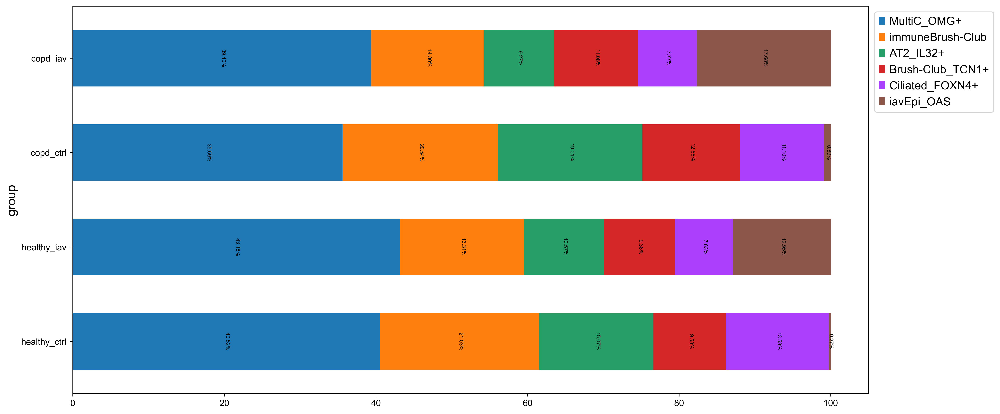

In [38]:
data = pd.crosstab(epith_multiC.obs['group'], epith_multiC.obs['fine_states'])
totals = data.sum(axis = 1)
percent = data.div(totals, axis = 0).mul(100).round(2)

ax1 = percent.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (16,8), fontsize = 10, grid = False, width = 0.6)
horiz_offset = 1.0
vert_offset = 1.0
ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset), ncol = 1)

for c in ax1.containers:
    
    # custom label calculates percent and add an empty string so 0 value bars don't have a number
    labels = [f'{w:0.2f}%' if (w := v.get_width()) > 0 else '' for v in c]
    
    # add annotations
    ax1.bar_label(c, labels = labels, label_type = 'center', padding = 1, color = 'black', rotation = 270, fontsize = 6)

### Export annotated sample object 

In [42]:
epith_multiC.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in epith_multiC.obs.index])
epith_multiC.obs.index

Index(['493638-ST07_CSE_CTRL-V1', '816750-ST07_CSE_CTRL-V1',
       '678000-ST07_CSE_CTRL-V1', '247802-ST07_CSE_CTRL-V1',
       '177433-ST07_CSE_CTRL-V1', '767740-ST07_CSE_CTRL-V1',
       '183623-ST07_CSE_CTRL-V1', '585589-ST07_CSE_CTRL-V1',
       '57505-ST07_CSE_CTRL-V1', '37357-ST07_CSE_CTRL-V1',
       ...
       '1344386-CSE03_IAV-V6', '6811469-CSE03_IAV-V6', '5906311-CSE03_IAV-V6',
       '4448713-CSE03_IAV-V6', '11092261-CSE03_IAV-V6', '7406666-CSE03_IAV-V6',
       '3549699-CSE03_IAV-V6', '298450-CSE03_IAV-V6', '8733006-CSE03_IAV-V6',
       '10787783-CSE03_IAV-V6'],
      dtype='object', length=4645)

In [43]:
epith_multiC.obs['C_scANVI_v2'].cat.categories

Index(['Goblet', 'Multiciliated', 'Suprabasal'], dtype='object')

In [45]:
epith_multiC.obs['fine_states'].value_counts()

MultiC_OMG+         1871
immuneBrush-Club     847
AT2_IL32+            612
Brush-Club_TCN1+     482
Ciliated_FOXN4+      471
iavEpi_OAS           362
Name: fine_states, dtype: int64

### Export annotated object with raw counts

In [46]:
epith_multiC.write('/Volumes/F-104/nobackup/raw_data/single_cell/COPD_IAV/working_objects/cellstates/multiC/Epithelial_MultiC_ctl230612_states.raw.h5ad')